**Data description**
1. Time: Number of seconds elapsed between this transaction and the first transaction in the dataset.
    
2. May be result of a PCA Dimensionality reduction to protect user identities and sensitive features(v1-v28)



In [1]:
# plotting and visualization
import pandas as pd
import numpy as np
from numpy import mean
from numpy import std
import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import scikitplot as skplt
import seaborn as sns
%matplotlib inline
sns.set()

# sklearn library
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import mutual_info_classif, SelectKBest
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score
from sklearn.ensemble import StackingClassifier

In [2]:
df = pd.read_csv('dataset/creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
df.shape

(284807, 31)

## Exploratory Data Analysis

In [4]:
# No missing data to deal with
df.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [5]:
# Unsurprisingly large class imbalance to deal with
display(df['Class'].value_counts())
fraudRatio = round(df['Class'].value_counts()[0] / df['Class'].value_counts()[1], 1)
print(f"Ratio of non-fraudulent vs fraudulent cases is: {fraudRatio}")

0    284315
1       492
Name: Class, dtype: int64

Ratio of non-fraudulent vs fraudulent cases is: 577.9


In [6]:
# Reassuring to see some difference between classes along the PCs
display(df.groupby('Class').mean())

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
Class,,,,,,,,,,,,,,,,,,,,,
0,94838.202258,0.008258,-0.006271,0.012171,-0.007860,0.005453,0.002419,0.009637,-0.000987,0.004467,...,-0.000644,-0.001235,-0.000024,0.000070,0.000182,-0.000072,-0.000089,-0.000295,-0.000131,88.291022
1,80746.806911,-4.771948,3.623778,-7.033281,4.542029,-3.151225,-1.397737,-5.568731,0.570636,-2.581123,...,0.372319,0.713588,0.014049,-0.040308,-0.105130,0.041449,0.051648,0.170575,0.075667,122.211321


In [7]:
# Time can be dropped as each purchase is unrelated to one another and if there is an apparent relationship, it is just a coincidence
df = df.drop(['Time'], axis = 1)
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [8]:
# check the data types
df.dtypes

V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

# Comparing the Distributions of each Feature to the Target Classes

Below, violin plots are used to compare the distributions of each feature to the target dataset. Beyond showing that there are differences in the distributions between each class.

In [9]:
fig = make_subplots(rows=6, cols=5, subplot_titles=list(df.columns))  

for row_num in range(1, 7):
    start_list = 0 + ((row_num-1) * 5)
    end_list = 5 + ((row_num-1) * 5)
    for idx, feature in enumerate(list(df.columns)[start_list: end_list]):
        fig.add_trace(go.Violin(x=df["Class"][df["Class"] == 1],
                                y=df[feature][df["Class"] == 1],
                                legendgroup="Fraud", scalegroup="Fraud", name="Fraud",
                                line_color="blue"),
                      row=row_num, col=(idx+1))
        fig.add_trace(go.Violin(x=df["Class"][df["Class"] == 0][::100], # 1 in 100 otherwise will crash...
                                y=df[feature][df["Class"] == 0][::100], # 1 in 100 otherwise will crash...
                                legendgroup="Not Fraud", scalegroup="Not Fraud", name="Not Fraud",
                                line_color='orange'),
                      row=row_num, col=(idx+1))

fig.update_traces(meanline_visible=True)
fig.update_layout(showlegend=False, violingap=0, height=1500,
                  title_text="Distributions of Fraudulent vs Not Fraudulent Transactions along each PC and Amount")
fig.show()

In [10]:
df.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 30 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      284807 non-null  float64
 1   V2      284807 non-null  float64
 2   V3      284807 non-null  float64
 3   V4      284807 non-null  float64
 4   V5      284807 non-null  float64
 5   V6      284807 non-null  float64
 6   V7      284807 non-null  float64
 7   V8      284807 non-null  float64
 8   V9      284807 non-null  float64
 9   V10     284807 non-null  float64
 10  V11     284807 non-null  float64
 11  V12     284807 non-null  float64
 12  V13     284807 non-null  float64
 13  V14     284807 non-null  float64
 14  V15     284807 non-null  float64
 15  V16     284807 non-null  float64
 16  V17     284807 non-null  float64
 17  V18     284807 non-null  float64
 18  V19     284807 non-null  float64
 19  V20     284807 non-null  float64
 20  V21     284807 non-null  float64
 21  V22     28

### Initial Machine Learning Tests Prior to Proper Model Building.

**Above, we saw that there is:**

1. There is a large class imbalance to be dealt with.

2. There are potentially outliers present. Further, the violin plots showed us some of the distributions do not have a gaussian distribution. This means that the outlier removal method chosen should be okay working with non-normal distributions.

3. Some features could be removed from the model as they do not appear to contribute much.

**Additional considerations**
1. Given what I have described above, there is a clear danger of having way too many things to try in combination with one another. I will therefore first test some of the ideas above out on a single, rapid to train model (logistic regression), and then make some decisions based on that on what to take forward for a second round with some other models. Edit: I added random forest after based on some observations.

**Therefore**
1. Building pipelines will be valuable here due to the desire to evaluate the impact of multiple things (e.g. outlier removal, feature removal, up and down sampling).

2. As I want to evaluate multiple protocols I will use stratified k-fold cross-validation. This means my training and testing data will be combined and I will use this approach to select my best model before final validation of this model with the "evaluation set".

3. I will use the Interquartile Range Method to try to detect and remove outliers from the model. We have so few samples of fraud that we will keep all of them, but for not fraud samples we will apply outlier removal.

4. I will evaluate my models with the roc_auc_score (as recommended by the challenge author). This provides a balanced view of model quality for both imbalanced and balanced datasets (test_train runs will always have a balanced dataset so technically not required at this stage).

In [12]:
# First and foremost, seperate my test and training set from my validation set before anything else. 
# 30% to validation, rest to training and testing with cross validation. 
# Use of the "stratify" parameter is important here as this way we will have... 
# a good mix of fraudulent and not fraudulent samples in both datasets.
X = (df.drop("Class", axis=1)).to_numpy() 
y = (df["Class"]).to_numpy() 

X_train_test, X_validation, y_train_test, y_validation = train_test_split(X, y, test_size = 0.3, stratify=y, random_state=1)

# confirms there is a well balanced number of 1's and 0's for both sets.
np.average(y_train_test), np.average(y_validation) 

(0.0017254870488152324, 0.0017321489179921118)

In [13]:
# For the outlier detection, I will put train_test data back into a dataframe so it is easier to manipulate.
df_train_test = pd.DataFrame(X_train_test, columns=list(df.columns[0:29])) 
df_train_test["Class"] = y_train_test
df_train_test.head(5)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1.135011,-0.663898,0.703924,0.069871,-0.488154,1.312078,-0.897198,0.463148,-0.478801,0.396879,...,-0.331487,-0.069644,0.183987,-0.618678,0.089015,0.521419,0.086390,0.004782,1.00,0
1,-1.786262,1.118886,1.347969,-0.379954,-1.240680,0.467667,0.081125,0.964933,0.042585,-1.275754,...,-0.047902,-0.182530,-0.162509,-0.405178,0.512595,0.299398,-0.042882,-0.059130,141.73,0
2,-0.683414,0.679341,2.615556,2.362138,-0.012716,0.603826,0.574245,-0.679978,-0.811409,2.035115,...,-0.007167,0.463597,-0.243134,0.084557,-0.453177,2.687676,-1.084269,-0.511626,36.19,0
3,1.183540,-0.493000,0.755202,-0.963160,-0.850295,0.145905,-0.794616,0.302199,1.656943,-0.939787,...,0.039588,0.339340,-0.053125,-0.298049,0.423994,-0.652284,0.102582,0.017292,1.00,0
4,1.137583,0.105478,0.784402,1.254973,-0.600870,-0.360836,-0.161727,0.076092,0.280587,0.015787,...,-0.195692,-0.443664,0.046270,0.516246,0.447943,-0.554949,0.031821,0.018177,7.60,0


In [14]:
# Below 2 helper functions are for outlier removal. 
def calc_iqr(x, cut_strength):
    """Calculate the interquartile range for a single feature.
    x is the dataframe column and cut_strength tunes the strength of the cut_off used.
    Output is the lower and upper bounds for filtering."""
    q25, q75 = np.percentile(x, 25), np.percentile(x, 75)
    iqr = q75 - q25
    # calculate the outlier cutoffs
    cut_off = iqr * cut_strength
    lower, upper = (q25 - cut_off), (q75 + cut_off)
    return lower, upper 

def outlier_removal(df, feature_columns, cut_strength):
    """Take as input (1) the dataframe to perform outlier removal on
    (2) the columns indexes which contain features to perform outlier removal on and
    (3) the cutoff strength for the outlier calculation (see above function).
    Determine the lower and upper limits for each column and append any rows which are outside the outliers. 
    Remove those rows if they are part of the not fraud class.
    Returns the prepared dataframe and states how many rows were removed."""
    outlier_list = []
    for col in feature_columns:
        lower, upper = calc_iqr(df[col], cut_strength)
        outliers = list( np.where( (df[col] < lower) | (df[col] > upper) ) [0])
        outlier_list.extend(outliers)
    outlier_set = set(outlier_list) # unique list of all rows that meet deletion requirements. 
    # prevents fraud rows from being deleted. 
    must_keep = list(np.where(df["Class"] == 1)[0])
    removal_list = [x for x in outlier_set if x not in must_keep]
    df_ready = df.drop(removal_list, axis="index")
    print(f"{len(removal_list)} outliers removed from the train_test dataset")
    return df_ready

In [15]:
# only those that seemed to be show a reasonable degree of correlation to the target variable are included here. 
# (Decided based on bar chart generated above.) 
# Amount also not included as seens unreasonable to remove high cost outliers especially from only one class. 
feature_columns = ["V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "V9", "V10", "V11", "V12", "V14",
                   "V16", "V17", "V18", "V19","V21", "V27", "V28"] 

cut_strength = 3
df_train_test_outliers_v1 = outlier_removal(df_train_test, feature_columns, cut_strength)

cut_strength = 5
df_train_test_outliers_v2 = outlier_removal(df_train_test, feature_columns, cut_strength)

cut_strength = 7
df_train_test_outliers_v3 = outlier_removal(df_train_test, feature_columns, cut_strength)

# remake the train_test arrays. 
X_train_test_outliers_v1 = (df_train_test_outliers_v1.drop("Class", axis=1)).to_numpy() 
y_train_test_outliers_v1 = (df_train_test_outliers_v1["Class"]).to_numpy()

X_train_test_outliers_v2 = (df_train_test_outliers_v2.drop("Class", axis=1)).to_numpy() 
y_train_test_outliers_v2 = (df_train_test_outliers_v2["Class"]).to_numpy()

X_train_test_outliers_v3 = (df_train_test_outliers_v3.drop("Class", axis=1)).to_numpy() 
y_train_test_outliers_v3 = (df_train_test_outliers_v3["Class"]).to_numpy()

26249 outliers removed from the train_test dataset
11238 outliers removed from the train_test dataset
6971 outliers removed from the train_test dataset


In [16]:
df.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [17]:
#import imblearn to balance the classes
import imblearn
from imblearn.over_sampling import SMOTE
from numpy import where
from collections import Counter
X = df.drop('Class', axis=1)
y = df['Class']
counter = Counter(y)
print(counter)

Counter({0: 284315, 1: 492})


In [18]:
oversample = SMOTE()
X,y = oversample.fit_resample(X,y)
counter = Counter(y)
print(counter)

Counter({0: 284315, 1: 284315})


In [19]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.3, random_state=1)

In [20]:
KNN = KNeighborsClassifier()
KNN.fit(X_train,y_train)

KNeighborsClassifier()

In [21]:
svm = LinearSVC()
svm.fit(X_train,y_train)

C:\Users\User\anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



LinearSVC()

In [22]:
y_preds = KNN.predict(X_test)

In [23]:
y_preds[:10]

array([0, 0, 1, 1, 0, 1, 1, 1, 1, 1], dtype=int64)

In [24]:
print(f'The accuracy score of the KNN model is: {accuracy_score(y_test,y_preds)*100}')
print(f'The balanced accuracy score of the KNN model is: {balanced_accuracy_score(y_test,y_preds)*100}')

The accuracy score of the KNN model is: 99.81124222546589
The balanced accuracy score of the KNN model is: 99.81152619081111


In [25]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85428
           1       1.00      1.00      1.00     85161

    accuracy                           1.00    170589
   macro avg       1.00      1.00      1.00    170589
weighted avg       1.00      1.00      1.00    170589



In [26]:
print(confusion_matrix(y_test,y_preds))

[[85112   316]
 [    6 85155]]


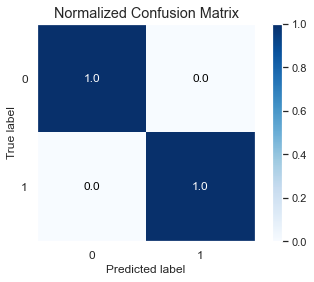

In [27]:
skplt.metrics.plot_confusion_matrix(y_test,y_preds, normalize=True)
plt.show()

In [28]:
y_preds_2 = svm.predict(X_test)

In [29]:
y_preds_2

array([0, 0, 1, ..., 1, 0, 0], dtype=int64)

In [30]:
print(f"The accuracy score of the svm model is: {accuracy_score(y_test,y_preds_2)}")
print(f"The balanced accuracy score of the svm model is: {balanced_accuracy_score(y_test,y_preds_2)}")

The accuracy score of the svm model is: 0.9495102263334682
The balanced accuracy score of the svm model is: 0.9494542905807364


In [31]:
print(classification_report(y_test,y_preds_2))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     85428
           1       0.98      0.91      0.95     85161

    accuracy                           0.95    170589
   macro avg       0.95      0.95      0.95    170589
weighted avg       0.95      0.95      0.95    170589



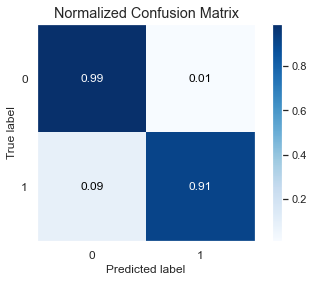

In [32]:
skplt.metrics.plot_confusion_matrix(y_test,y_preds_2, normalize=True)
plt.show()

### Hybridization of KNN-SVM machine learning models using Stacking

After we have trained the data on the KNN and SVM model respectively, we carry out the following:

1. After Implementing the KNN classification model to predict the test set.

2. We then, implement the Support Vector machine classifier model on the outcome of the KNN classification model.

3. Finally, we then analyze the performance of the hybrid model in terms of different performance parameters.

>KNN 0.997 (0.000)
>SVM 0.936 (0.013)
>KNN-SVM 0.994 (0.004)


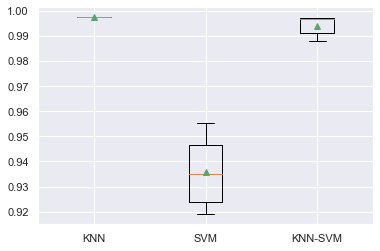

In [33]:
# performing stacking operation to combine the KNN and SVM model together
# get a stacking ensembles of models
def stacked_models():
    #define the base models
    level0 = list()
    level0.append(('KNN', KNeighborsClassifier()))
    level0.append(('SVM', LinearSVC()))
    #define the meta learner model
    level1 = KNeighborsClassifier()
    #define the stacking ensemble
    model = StackingClassifier(estimators = level0, final_estimator=level1, cv=2)
    return model

# get a list of models to evaluate
def clf_models():
    models = dict()
    models['KNN'] = KNeighborsClassifier()
    models['SVM'] = LinearSVC()
    models['KNN-SVM'] = stacked_models()
    return models

#evaluate a given model using cross validation 
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits = 2, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

# get the models to evaluate
models = clf_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X, y)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()